<a href="https://colab.research.google.com/github/salwazpw/PCVK_Genap_2023/blob/main/UTS_Nazela_Salwa.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Import Library**

In [ ]:
from google.colab import drive

drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import io
import cv2 as cv
from google.colab.patches import cv2_imshow
from PIL import Image as im
import glob
from math import log10, sqrt
import math

# **WEEK 1**

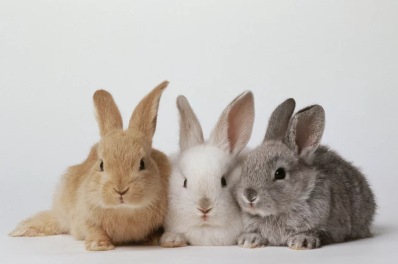

In [ ]:
original = cv.imread('/content/drive/MyDrive/PCVK/UTS/bunny.jpg')
image = cv.resize(original, (0,0), fx=0.5, fy=0.5) #resize image to half size
cv2_imshow(image)               #show image

## **Implementasi Mencetak Ukuran Gambar**

Resolusi image: tinggi x lebar =  529  x  796


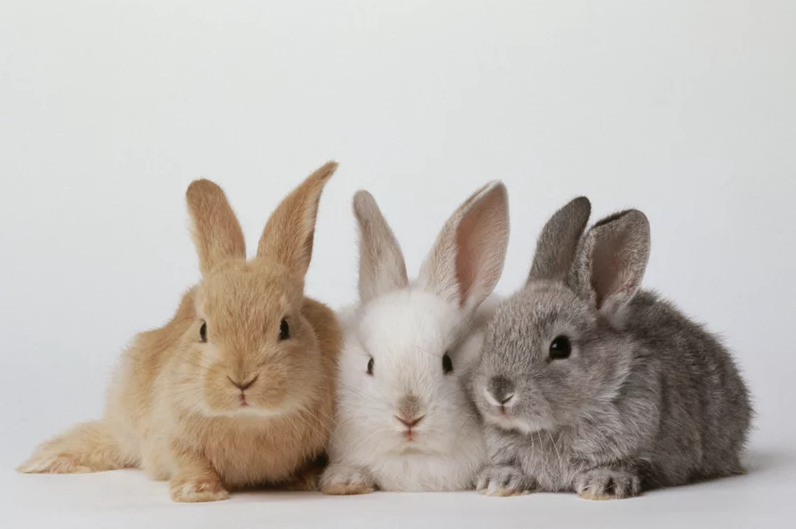

In [ ]:
# Sebelum di resize
tinggi = original.shape[0]
lebar = original.shape[1]
print("Resolusi image: tinggi x lebar = ", tinggi, " x ", lebar)
cv2_imshow(original)

Resolusi image: tinggi x lebar =  264  x  398


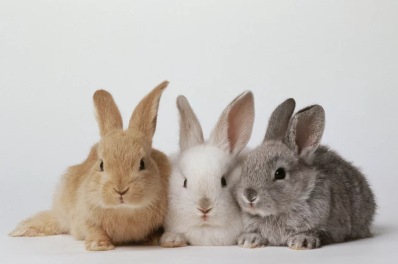

In [ ]:
# Sesudah di resize
tinggi = image.shape[0]
lebar = image.shape[1]
print("Resolusi image: tinggi x lebar = ", tinggi, " x ", lebar)
cv2_imshow(image)

## **Implementasi Pembuatan Garis**

### horizontal

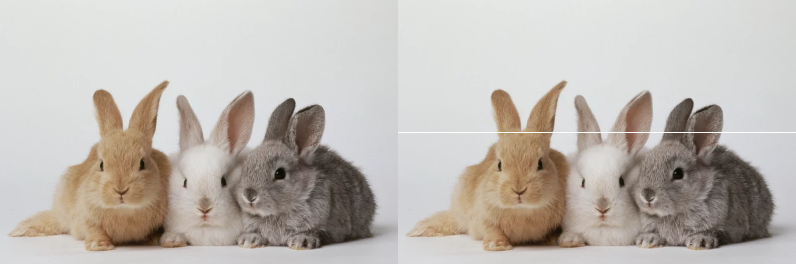

In [ ]:
image_2 = cv.resize(original, (0,0), fx=0.5, fy=0.5)
image_3 = cv.resize(original, (0,0), fx=0.5, fy=0.5)

#Membuat garis horizontal ditengah image
for y in range (lebar):
  image_3[int((tinggi)/2),y] = [255,255,255]

final_frame = cv.hconcat((image_2, image_3))
cv2_imshow(final_frame)

### Vertikal

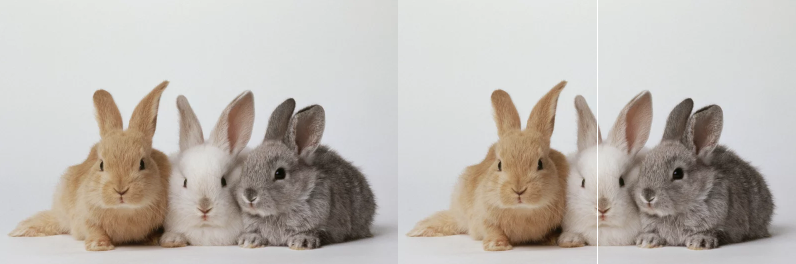

In [ ]:
original = cv.imread('/content/drive/MyDrive/PCVK/UTS/bunny.jpg')
image_2 = cv.resize(original, (0,0), fx=0.5, fy=0.5)
image_3 = cv.resize(original, (0,0), fx=0.5, fy=0.5)

#Membuat garis vertikal ditengah image
for x in range (tinggi):
  image_3[x, int((lebar)/2)] = [255,255,255]

final_frame = cv.hconcat((image_2, image_3))
cv2_imshow(final_frame)

### Diagonal

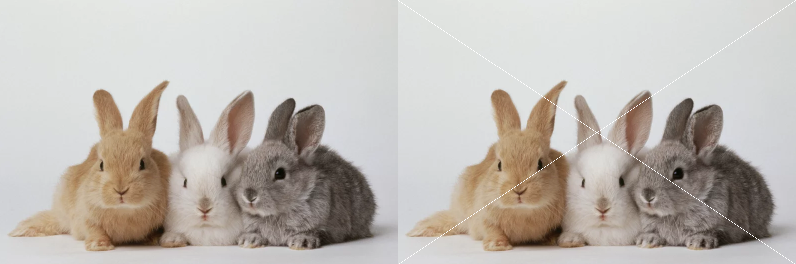

In [ ]:
image_2 = cv.resize(original, (0,0), fx=0.5, fy=0.5)
image_3 = cv.resize(original, (0,0), fx=0.5, fy=0.5)

# membuat garis menyilang diagonal 
for y in range (tinggi):
  image_3[y, int(y*(lebar/tinggi))] = [255,255,255]
  image_3[y, lebar - 1 - int(y*(lebar/tinggi))] = [255,255,255]

final_frame = cv.hconcat((image_2, image_3))
cv2_imshow(final_frame)

### horizontal berwarna putih dibagian tengah gambar dengan panjang tertentu

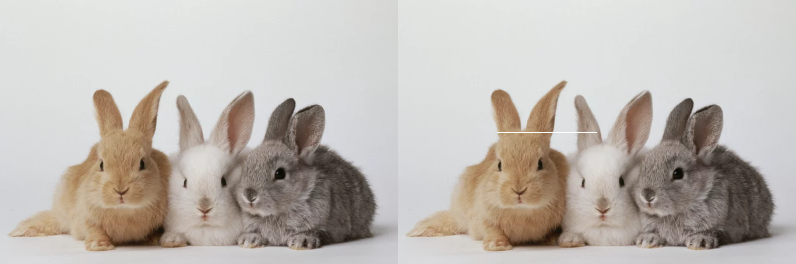

In [ ]:
image_2 = cv.resize(original, (0,0), fx=0.5, fy=0.5)
image_3 = cv.resize(original, (0,0), fx=0.5, fy=0.5)

# membuat garis horizontal putih ditengah gambar dengan panjang tertentu
y1 = int(lebar/4)
y2 = int(lebar/4*2)

for y in range (y1, y2) :
  image_3[int(tinggi/2),y] = [255,255,255]
final_frame = cv.hconcat((image_2, image_3))
cv2_imshow(final_frame)

# **WEEK 3**

## **Implementasi Transformasi Linier Brightness**

Formula: g(x,y) = f(x,y)+b



*   **g(x,y)** adalah nilai pixel setelah transformasi.
*   **f(x,y)** adalah nilai pixel asli
*   **b** adalah nilai brightness

Mengubah tingkat kecerahan citra
--------------------------------
Masukkan nilai kecerahan: 40


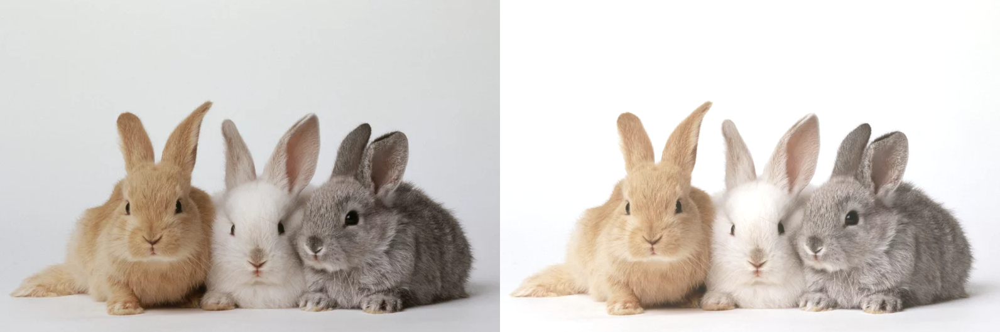

In [ ]:
print('Mengubah tingkat kecerahan citra')
print('--------------------------------')

brightness = int(input('Masukkan nilai kecerahan: '))

original = cv.imread('/content/drive/MyDrive/PCVK/UTS/bunny.jpg') # get image from gdrive
brightness_image = np.zeros(original.shape, original.dtype)

#akses per piksel
for y in range(original.shape[0]): #mengakses tinggi pada gambar
  for x in range(original.shape[1]): #mengakses lebar pada gambar
    for c in range(original.shape[2]): #mengakses chanel gambar
      brightness_image[y,x,c] = np.clip(original[y,x,c] + brightness, 0, 255)

final_frame = cv.hconcat((original, brightness_image))
cv2_imshow(final_frame)

## **Implementasi Transformasi Contrast**

Formula: g(x,y) = a f(x,y) + b


*   **g(x,y)** adalah nilai pixel setelah transformasi
*   **f(x,y)** adalah nilai pixel asli
*   **a** adalah nilai contrast
*   **b** adalah nilai brightness

Mengubah kontras tingkat kecerahan citra
--------------------------------
Masukkan tingkat kecerahan: 60
Masukkan kontras: 1.0


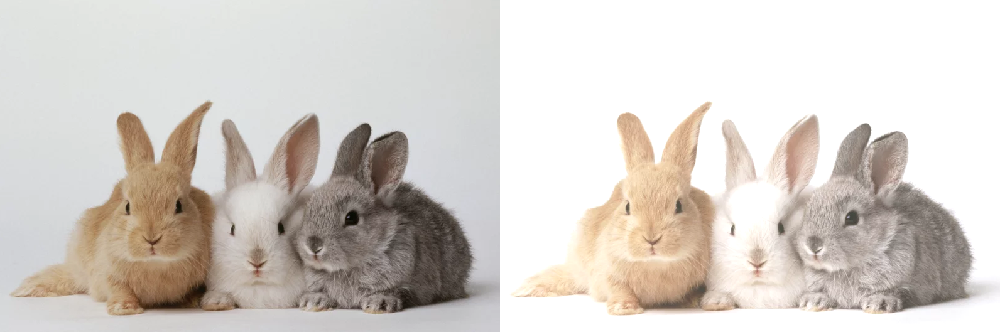

In [ ]:
print('Mengubah kontras tingkat kecerahan citra')
print('--------------------------------')

brightness = int(input('Masukkan tingkat kecerahan: '))
contrast = float(input('Masukkan kontras: '))
  
original = cv.imread('/content/drive/MyDrive/PCVK/UTS/bunny.jpg')
contrast_image = np.zeros(original.shape, original.dtype)

#akses per piksel
for y in range(original.shape[0]):
  for x in range(original.shape[1]):
    for c in range(original.shape[2]):
      contrast_image[y,x,c] = np.clip(contrast * original[y,x,c] + brightness, 0, 255)

final_frame = cv.hconcat((original, contrast_image))
cv2_imshow(final_frame)

## **Transformasi Logarithmic Brightness**

Formula: s = c log(1 + r)

*   **c** adalah konstanta
*   **r** adalah nilai grey-level citra input
*   **s** adalah nilai grey-level citra output



 Mengubah tingkat kecerahan citra dengan Transformasi Log 
----------------------------------------------------------
Masukan nilai kecerahan: 40


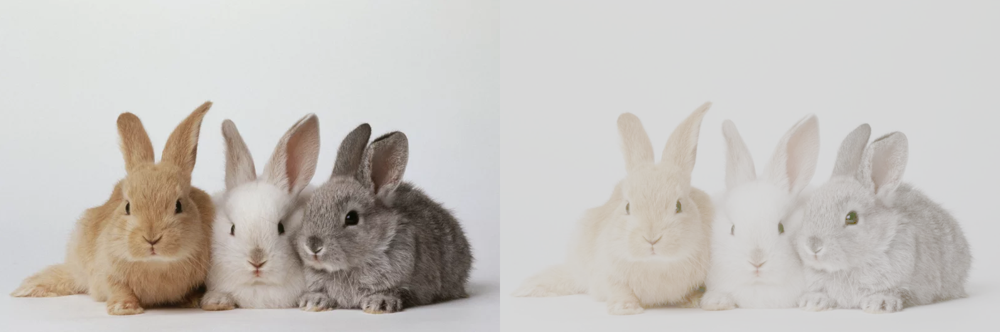

In [ ]:
print(' Mengubah tingkat kecerahan citra dengan Transformasi Log ')
print('----------------------------------------------------------')

brightness = int(input('Masukan nilai kecerahan: '))

original = cv.imread('/content/drive/MyDrive/PCVK/UTS/bunny.jpg')
brightness_image = np.zeros(original.shape, original.dtype)

for y in range(original.shape[0]):
  for x in range(original.shape[1]):
    for c in range(original.shape[2]):
      brightness_image[y,x,c] = np.clip(brightness * (np.log(1 + original[y,x,c])), 0 , 255)

final_frame = cv.hconcat((original, brightness_image))
cv2_imshow(final_frame)

## **Implementasi Grayscale**

### Averaging

Formula: (R+G+B)/3
*   **R** adalah Red
*   **G** adalah Green
*   **B** adalah Blue




Implementasikan Transformasi Grayscale menggunakan metode Averaging
-----------------------------------
Averaging


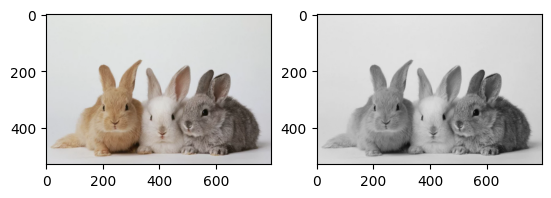

In [ ]:
print('Implementasikan Transformasi Grayscale menggunakan metode Averaging')
print('-----------------------------------')

image2 = cv.imread('/content/drive/MyDrive/PCVK/UTS/bunny.jpg')
averaging_image = np.zeros(image2.shape, image2.dtype)

image2 = cv.cvtColor(image2, cv.COLOR_BGR2RGB)

#Akses per piksel
for y in range(image2.shape[0]):
  for x in range(image2.shape[1]):
    blue = image2.item(y,x,0)
    green = image2.item(y,x,1)
    red = image2.item(y,x,2)
    average = (blue + green + red) / 3
    averaging_image[y,x] = [average, average, average] #dijadikan nilai intensitas untuk setiap saluran warna pada piksel 
    

print('Averaging')
fig, ax = plt.subplots(1,2)
ax[0].imshow(image2)
ax[1].imshow(averaging_image)

### Lightness

Formula: max[R+G+B]+min[R+G+B]/2
*   **R** adalah Red
*   **G** adalah Green
*   **B** adalah Blue



Implementasikan Transformasi Grayscale menggunakan metode Lightness
-----------------------------------
Lightness


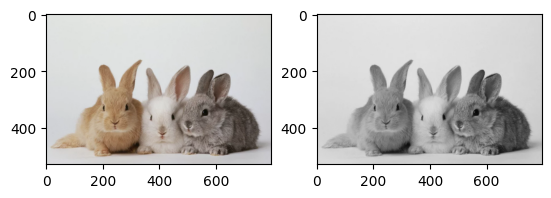

In [ ]:
print('Implementasikan Transformasi Grayscale menggunakan metode Lightness')
print('-----------------------------------')

image3 = cv.imread('/content/drive/MyDrive/PCVK/UTS/bunny.jpg')
lightness_image3 = np.zeros(image3.shape, image3.dtype)

image3 = cv.cvtColor(image3, cv.COLOR_BGR2RGB)

#Akses per piksel
for y in range(image3.shape[0]):
  for x in range(image3.shape[1]):
    blue = image3.item(y,x,0)
    green = image3.item(y,x,1)
    red = image3.item(y,x,2)
    maxBGR = max(blue,green,red)
    minBGR = min(blue, green, red)
    lightness_value = (maxBGR + minBGR) / 2
    lightness_image3[y,x] = [lightness_value, lightness_value, lightness_value]
    
print('Lightness')
fig, ax = plt.subplots(1,2)
ax[0].imshow(image3)
ax[1].imshow(lightness_image3)

### **Luminance**
Formula: 0.21R + 0.7G + 0.07B
*   **R** adalah Red
*   **G** adalah Green
*   **B** adalah Blue

Implementasikan Transformasi Grayscale menggunakan metode Luminance
-----------------------------------
Luminance


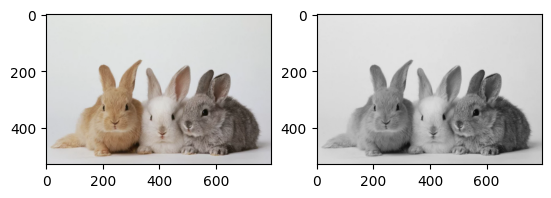

In [ ]:
print('Implementasikan Transformasi Grayscale menggunakan metode Luminance')
print('-----------------------------------')

image4 = cv.imread('/content/drive/MyDrive/PCVK/UTS/bunny.jpg')
luminance_image4 = np.zeros(image4.shape, image4.dtype)

image4 = cv.cvtColor(image4, cv.COLOR_BGR2RGB)

#Akses per piksel
for y in range(image4.shape[0]):
  for x in range(image4.shape[1]):
    blue = image4.item(y,x,0)
    green = image4.item(y,x,1)
    red = image4.item(y,x,2)
    maxBGR = max(blue,green,red)
    minBGR = min(blue, green, red)
    luminance_value = 0.21 * red + 0.72 * green + 0.07 * blue
    luminance_image4[y,x] = [luminance_value, luminance_value, luminance_value]
    
  
print('Luminance')
fig, ax = plt.subplots(1,2)
ax[0].imshow(image3)
ax[1].imshow(luminance_image4)

# **WEEK 5**

## **Implementasi Gamma Correction**
Rumus: 255 x (1/255)^1/γ

 Gamma Correction pada citra 
----------------------------------
Masukkan nilai Gamma: 3


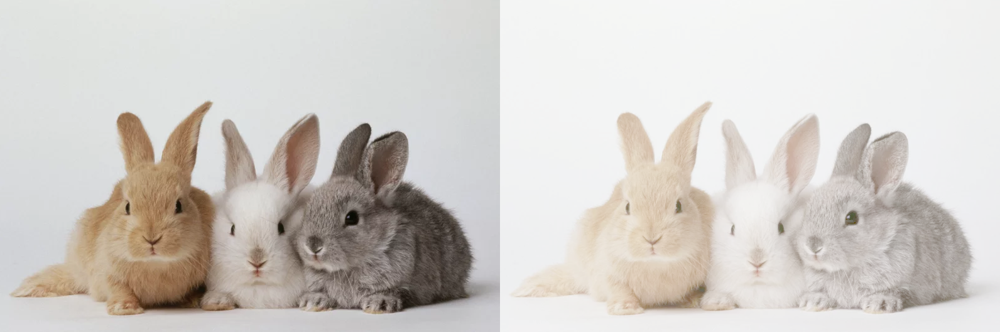

In [ ]:
print(' Gamma Correction pada citra ')
print('----------------------------------')

gamma = int(input('Masukkan nilai Gamma: '))

original = cv.imread('/content/drive/MyDrive/PCVK/UTS/bunny.jpg')
gama_image = np.zeros(original.shape, original.dtype)

for y in range(original.shape[0]):
    for x in range(original.shape[1]):
        for c in range(original.shape[2]):
            gama_image[y,x,c] = np.clip(255 * pow(original[y,x,c]/255,(1/gamma)),0,255)

final_frame = cv.hconcat((original,gama_image))
cv2_imshow(final_frame)

## **Implementasi Simulasi Image Depth**
Rumus: round((c/level)* level)


level: 255/2^bith_depth - 1

 Bit Depth pada Citra
---------------------------------
Masukkan nilai bit depth: 2


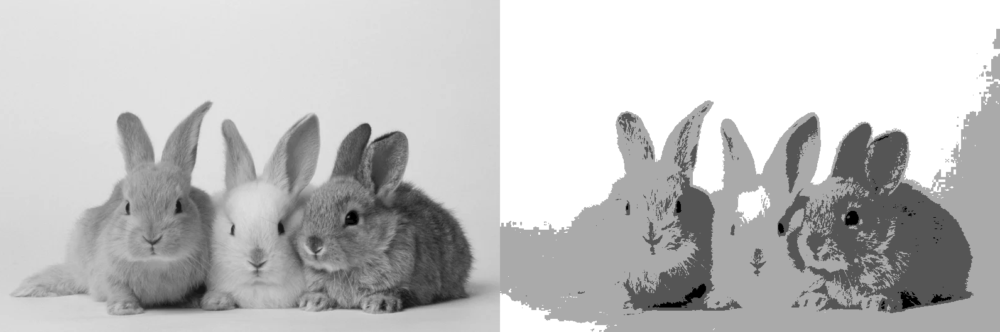

In [ ]:
print(' Bit Depth pada Citra')
print('---------------------------------')

bd = float(input('Masukkan nilai bit depth: '))

bit_depth = 2**bd
level = 255 / (bit_depth - 1)

original = cv.imread('/content/drive/MyDrive/PCVK/UTS/bunny.jpg', cv.IMREAD_GRAYSCALE)

bit_depth_image = np.zeros(original.shape, original.dtype)

#akses per piksel
for y in range(original.shape[0]):
  for x in range(original.shape[1]):
       bit_depth_image[y,x] = np.clip(round(original[y,x] / level) * level, 0, 255)

final_frame = cv.hconcat((original, bit_depth_image))
cv2_imshow(final_frame)

## **Implementasi Average Denoising**

Average Denoising Pada Citra
-------------------------------
Masukkan jumlah citra: 5


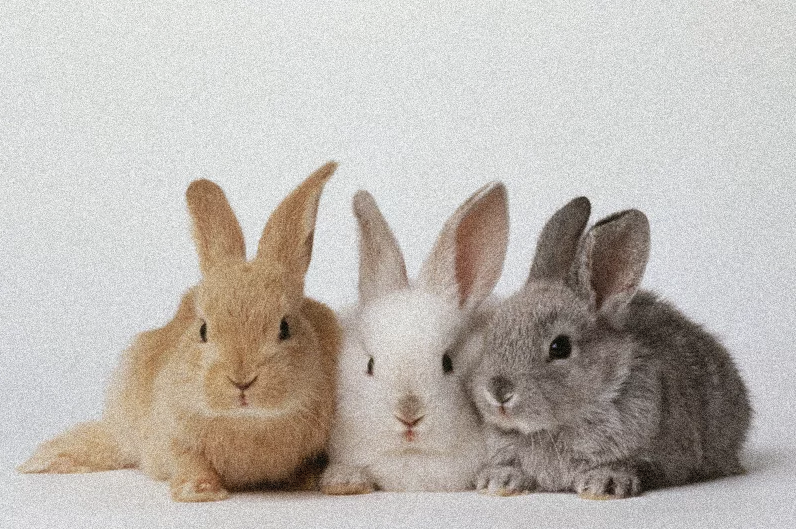

Nilai PSNR adalah 26.8926498416377 (dB)
Nilai MSE adalah 132.98889475734055


In [ ]:
from math import log10, sqrt
import math
  
print('Average Denoising Pada Citra')
print('-------------------------------')

original_image = cv.imread('/content/drive/MyDrive/PCVK/UTS/bunny.jpg')
cv_img = []
for img in glob.glob('/content/drive/MyDrive/PCVK/UTS/noises/*.jpg'):
  n = cv.imread(img)
  cv_img.append(n)


def PSNR(img1, img2):
  mse = np.mean((img1 - img2) ** 2)
  if(mse == 0): # MSE 0 maka tidak ada noise sama sekali, sehingga PSNR tidak memiliki arti
    return 100, mse
  max_pixel = 255.0
  psnr = 20 * math.log10(max_pixel / math.sqrt(mse))
  return psnr, mse

jumlah_citra = int(input('Masukkan jumlah citra: '))

noised_image = np.zeros(cv_img[0].shape)
for i in range (jumlah_citra):
  noised_image = noised_image+cv_img[i]
  
noised_image = noised_image / jumlah_citra
cv2_imshow(noised_image)

psnr, mse = PSNR(original_image, noised_image)
print('Nilai PSNR adalah', psnr, '(dB)')
print('Nilai MSE adalah', mse)

Average Denoising Pada Citra
-------------------------------
Masukkan jumlah citra: 50


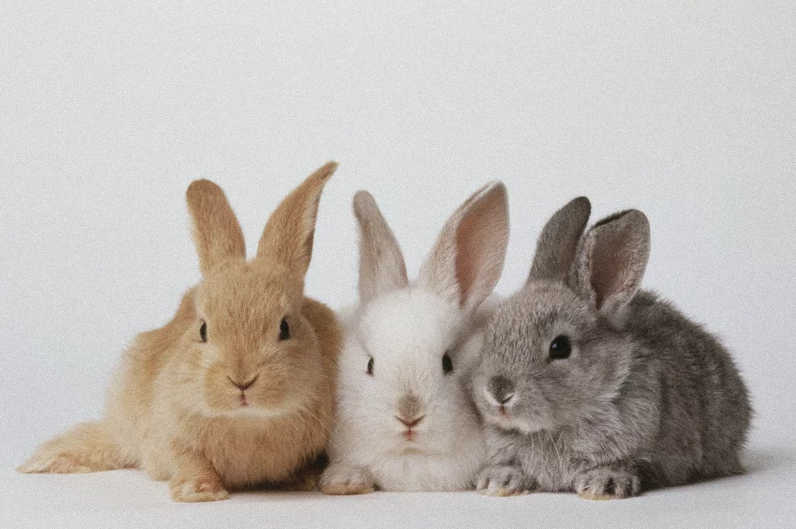

Nilai PSNR adalah 34.091856553474045 (dB)
Nilai MSE adalah 25.345140643355403


In [ ]:
from math import log10, sqrt
import math
  
print('Average Denoising Pada Citra')
print('-------------------------------')

original_image = cv.imread('/content/drive/MyDrive/PCVK/UTS/bunny.jpg')
cv_img = []
for img in glob.glob('/content/drive/MyDrive/PCVK/UTS/noises/*.jpg'):
  n = cv.imread(img)
  cv_img.append(n)


def PSNR(img1, img2):
  mse = np.mean((img1 - img2) ** 2)
  if(mse == 0): # MSE 0 maka tidak ada noise sama sekali, sehingga PSNR tidak memiliki arti
    return 100, mse
  max_pixel = 255.0
  psnr = 20 * math.log10(max_pixel / math.sqrt(mse))
  return psnr, mse

jumlah_citra = int(input('Masukkan jumlah citra: '))

noised_image = np.zeros(cv_img[0].shape)
for i in range (jumlah_citra):
  noised_image = noised_image+cv_img[i]
  
noised_image = noised_image / jumlah_citra
cv2_imshow(noised_image)

psnr, mse = PSNR(original_image, noised_image)
print('Nilai PSNR adalah', psnr, '(dB)')
print('Nilai MSE adalah', mse)

Average Denoising Pada Citra
-------------------------------
Masukkan jumlah citra: 100


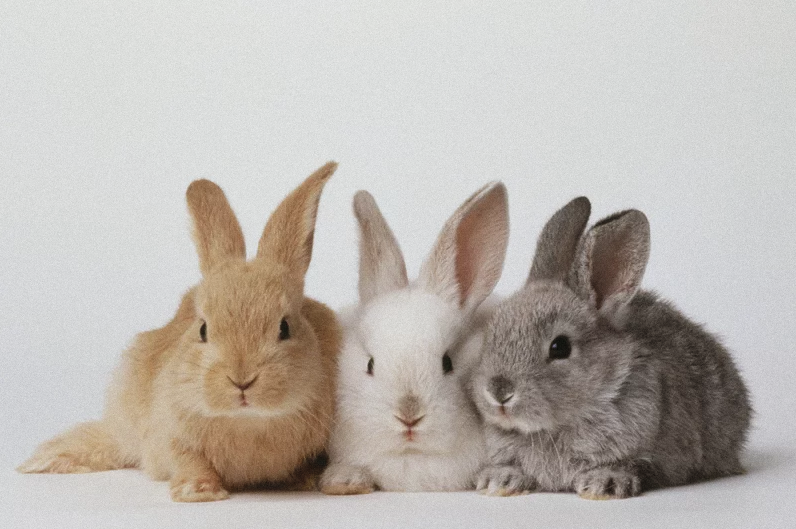

Nilai PSNR adalah 34.68024934067377 (dB)
Nilai MSE adalah 22.13377173675562


In [ ]:
from math import log10, sqrt
import math
  
print('Average Denoising Pada Citra')
print('-------------------------------')

original_image = cv.imread('/content/drive/MyDrive/PCVK/UTS/bunny.jpg')
cv_img = []
for img in glob.glob('/content/drive/MyDrive/PCVK/UTS/noises/*.jpg'):
  n = cv.imread(img)
  cv_img.append(n)


def PSNR(img1, img2):
  mse = np.mean((img1 - img2) ** 2)
  if(mse == 0): # MSE 0 maka tidak ada noise sama sekali, sehingga PSNR tidak memiliki arti
    return 100, mse
  max_pixel = 255.0
  psnr = 20 * math.log10(max_pixel / math.sqrt(mse))
  return psnr, mse

jumlah_citra = int(input('Masukkan jumlah citra: '))

noised_image = np.zeros(cv_img[0].shape)
for i in range (jumlah_citra):
  noised_image = noised_image+cv_img[i]
  
noised_image = noised_image / jumlah_citra
cv2_imshow(noised_image)

psnr, mse = PSNR(original_image, noised_image)
print('Nilai PSNR adalah', psnr, '(dB)')
print('Nilai MSE adalah', mse)

## **Implementasi Image masking**

Operator AND

resolusi image : height x width  529  x  796


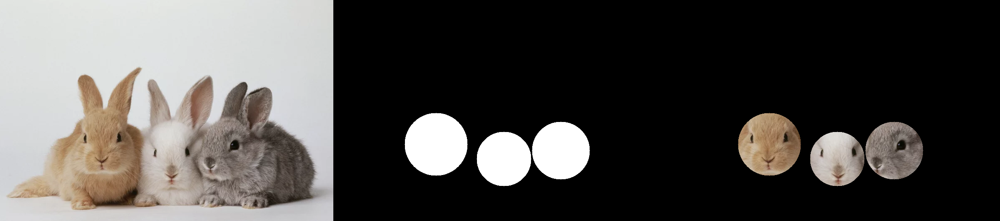

In [ ]:
img = cv.imread('/content/drive/MyDrive/PCVK/UTS/bunny.jpg')

height = img.shape[0]
width = img.shape[1]
print("resolusi image : height x width ", height, " x ",width)

mask = np.zeros(img.shape, img.dtype)

mask = cv.circle(mask, (245,345), 75, (255,255,255), -1)
result = img & mask

mask1 = cv.circle(mask, (407,380), 65, (255,255,255), -1)
result = img & mask1

mask2 = cv.circle(mask1, (543,360), 69, (255,255,255), -1)
result = img & mask2

final_frame = cv.hconcat((img, mask, result))
cv2_imshow(final_frame)

OR

resolusi image : height x width  529  x  796


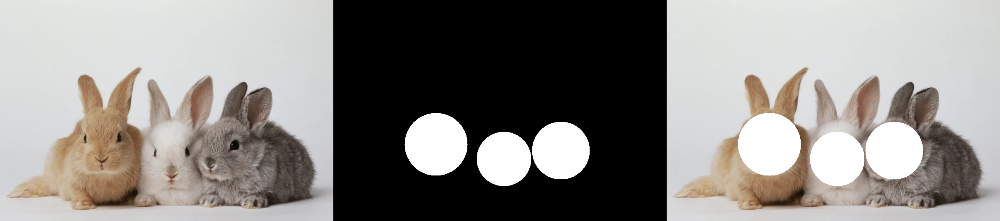

In [ ]:
img = cv.imread('/content/drive/MyDrive/PCVK/UTS/bunny.jpg')

height = img.shape[0]
width = img.shape[1]
print("resolusi image : height x width ", height, " x ",width)

mask = np.zeros(img.shape, img.dtype)

mask = cv.circle(mask, (245,345), 75, (255,255,255), -1)
result = img | mask

mask1 = cv.circle(mask, (407,380), 65, (255,255,255), -1)
result = img | mask1

mask2 = cv.circle(mask1, (543,360), 69, (255,255,255), -1)
result = img | mask2

final_frame = cv.hconcat((img, mask, result))
cv2_imshow(final_frame)

NOT

resolusi image : height x width  529  x  796


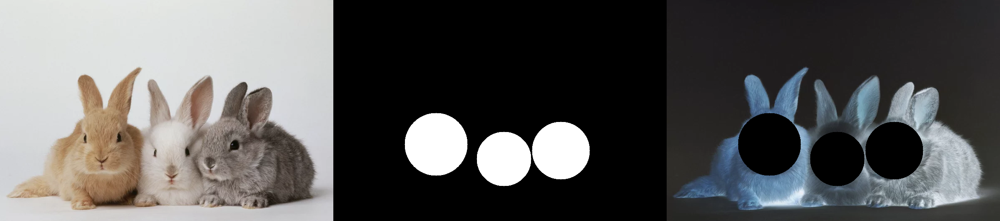

In [ ]:
img = cv.imread('/content/drive/MyDrive/PCVK/UTS/bunny.jpg')

height = img.shape[0]
width = img.shape[1]
print("resolusi image : height x width ", height, " x ",width)

mask = np.zeros(img.shape, img.dtype)

mask = cv.circle(mask, (245,345), 75, (255,255,255), -1)
result = ~img & ~mask

mask1 = cv.circle(mask, (407,380), 65, (255,255,255), -1)
result = ~img & ~mask1

mask2 = cv.circle(mask1, (543,360), 69, (255,255,255), -1)
result =~img & ~mask2

final_frame = cv.hconcat((img, mask, result))
cv2_imshow(final_frame)

NAND

resolusi image : height x width  529  x  796


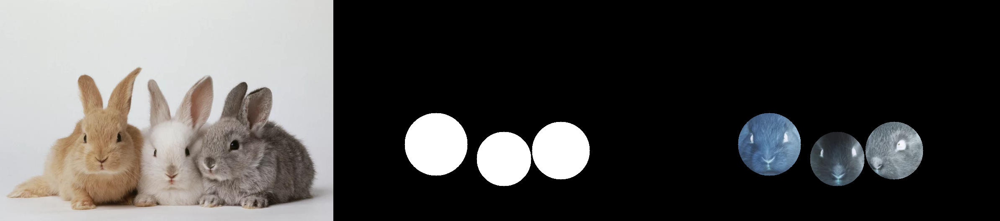

In [ ]:
img = cv.imread('/content/drive/MyDrive/PCVK/UTS/bunny.jpg')

height = img.shape[0]
width = img.shape[1]
print("resolusi image : height x width ", height, " x ",width)

mask = np.zeros(img.shape, img.dtype)

mask = cv.circle(mask, (245,345), 75, (255,255,255), -1)
result = ~img & mask

mask1 = cv.circle(mask, (407,380), 65, (255,255,255), -1)
result = ~img & mask1

mask2 = cv.circle(mask1, (543,360), 69, (255,255,255), -1)
result =~img & mask2

final_frame = cv.hconcat((img, mask, result))
cv2_imshow(final_frame)

XOR

resolusi image : height x width  529  x  796


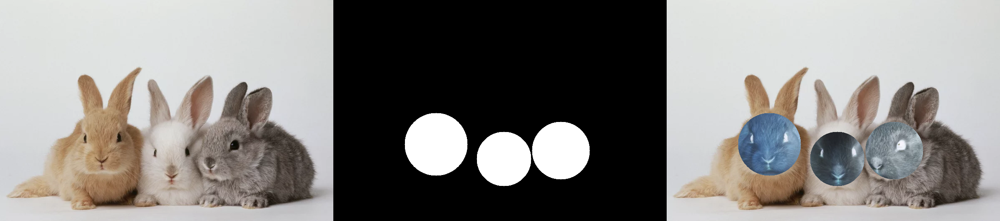

In [ ]:
img = cv.imread('/content/drive/MyDrive/PCVK/UTS/bunny.jpg')

height = img.shape[0]
width = img.shape[1]
print("resolusi image : height x width ", height, " x ",width)

mask = np.zeros(img.shape, img.dtype)

mask = cv.circle(mask, (245,345), 75, (255,255,255), -1)
result = img ^ mask

mask1 = cv.circle(mask, (407,380), 65, (255,255,255), -1)
result = img ^ mask1

mask2 = cv.circle(mask1, (543,360), 69, (255,255,255), -1)
result =img ^ mask2

final_frame = cv.hconcat((img, mask, result))
cv2_imshow(final_frame)

# **WEEK 2**

## **Mencetak Gambar Menggunakan Plotlib**

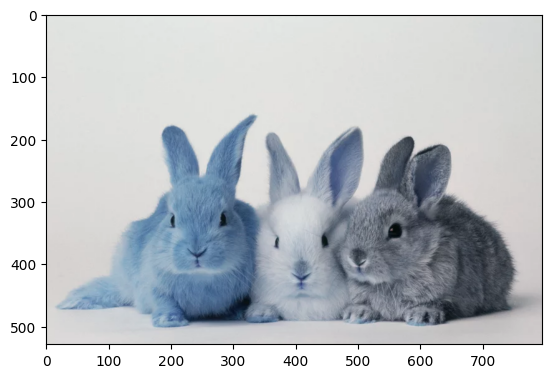

In [ ]:
img = cv.imread('/content/drive/MyDrive/PCVK/UTS/bunny.jpg')
plt.imshow(img)

## **Konversi Channel BGR to RGB**

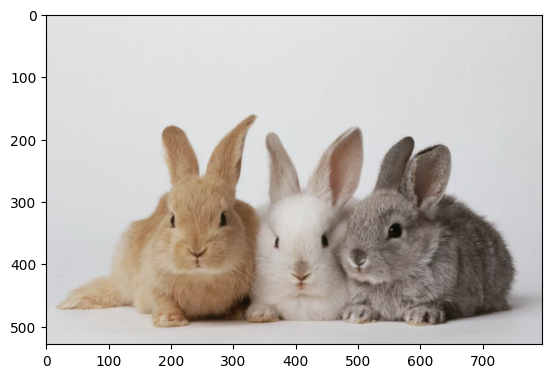

In [ ]:
img2 = img
img3 = cv.cvtColor(img, cv.COLOR_BGR2RGB)  #konversi channel BGR -> RGB
plt.imshow(img3)

## **Implementasi Cmap Grey**

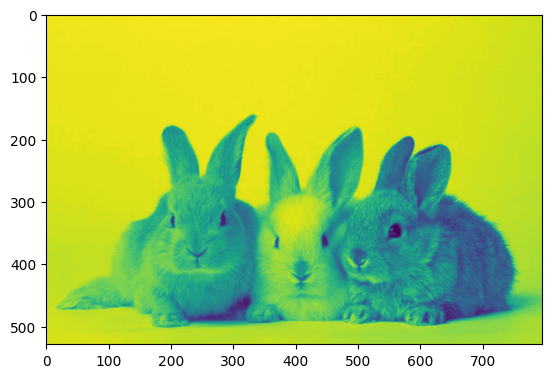

In [ ]:
img_gray = cv.imread('/content/drive/MyDrive/PCVK/UTS/bunny.jpg', cv.IMREAD_GRAYSCALE)
plt.imshow(img_gray)

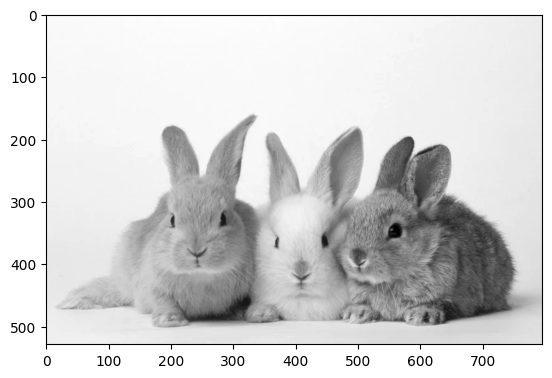

In [ ]:
plt.imshow(img_gray,cmap='gray')

## **Implementasi Menampilkan Image baris tertentu**

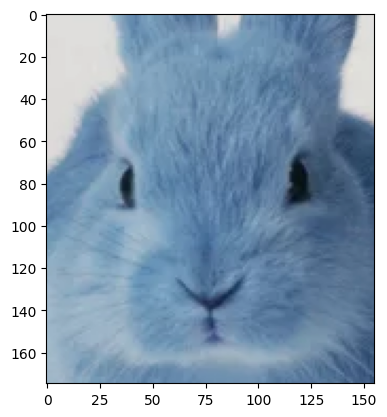

In [ ]:
images = cv.imread('/content/drive/MyDrive/PCVK/UTS/bunny.jpg')
imgt = images[250:425, 165:320]
plt.imshow(imgt)

## **Implementasi Resize Panjang dan Tinggi**

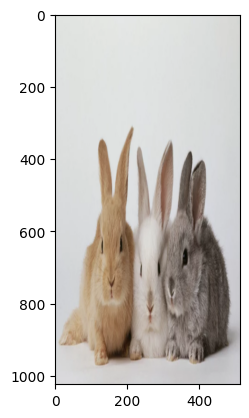

In [ ]:
img4 = cv.resize(cv.cvtColor(img,cv.COLOR_BGR2RGB),(512,1024))
plt.imshow(img4)

## **Implementasi Flip dan Figsize**

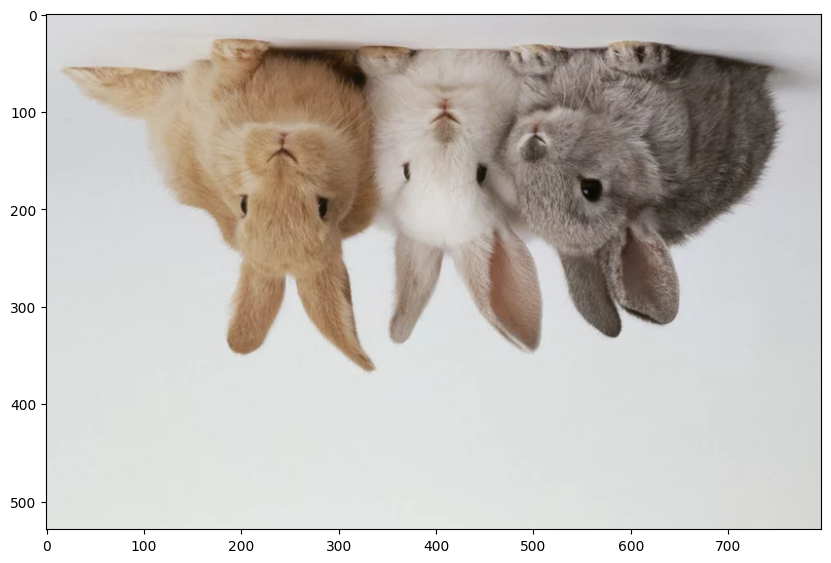

In [ ]:
img5 = cv.flip(cv.cvtColor(img, cv.COLOR_BGR2RGB),0)
#Tampilkan plot dengan ukuran kanvas yang lebih besar
fig = plt.figure(figsize=(10,10)) 
ax = fig.add_subplot(111)
ax.imshow(img5)

## **Implementasi Flip tanpa Figsize**

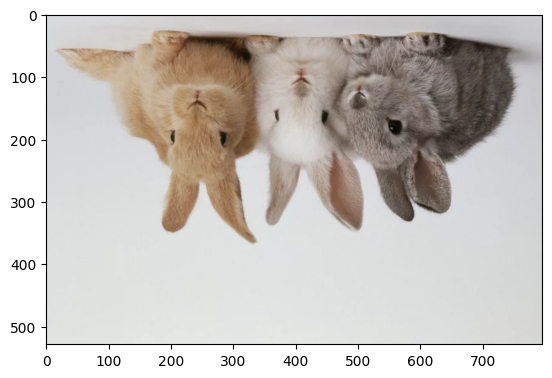

In [ ]:
img6 = cv.flip(cv.cvtColor(img,cv.COLOR_BGR2RGB), 0)
plt.imshow(img6)

## **Implementasi Pembuatan Rectangle dan Circle**

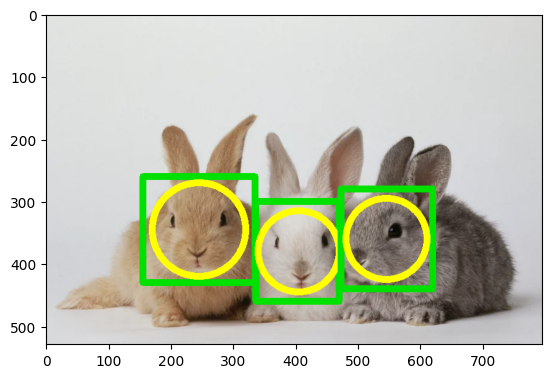

In [ ]:
img7 = img3.copy()
cv.rectangle(img7, pt1=(155,260), pt2 = (335,430), color= (0,225,0), thickness=10)
cv.circle(img7, center=(245,345),radius=75, color= (255,255,0), thickness=10)

cv.rectangle(img7, pt1=(336,300), pt2 = (470,460), color= (0,225,0), thickness=10)
cv.circle(img7, center=(405,380),radius=65, color= (255,255,0), thickness=10)

cv.rectangle(img7, pt1=(473,280), pt2 = (620,440), color= (0,225,0), thickness=10)
cv.circle(img7, center=(546,360),radius=65, color= (255,255,0), thickness=10)

plt.imshow(img7)

## **Implementasi Pembuatan Tulisan**

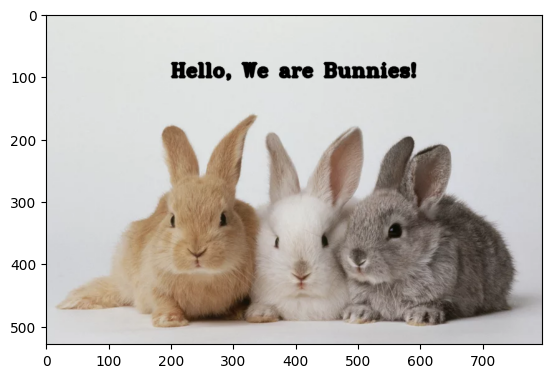

In [ ]:
img8 = img3.copy()
font  = cv.FONT_HERSHEY_TRIPLEX
cv.putText(img8, text="Hello, We are Bunnies!", org=(200,100), fontFace=font, fontScale=1, color =(0,0,0),thickness = 3, lineType = cv.LINE_AA)
plt.imshow(img8)

# **WEEK 7**

## **implementasi Konvolusi tanpa Library**

Membuat fungsi konvolusi

Fungsi konvolusi yang dibuat memiliki parameter berupa:


1. citra masukan,
2. kernel berupa matriks untuk memfilter citra,
3. nilai stride/besarnya pergeseran untuk setiap konvolusi,
4. nilai pad yang akan ditambahkan pada citra






In [ ]:
def convolution2d(image, kernel, stride, padding):

  image = np.pad(image, padding, mode='constant', constant_values=0)

  kernel_height, kernel_width = kernel.shape #dr kernel
  padded_height, padded_width = image.shape #gambar hasil padding

  output_height = (padded_height - kernel_height) // stride + 1
  output_width = (padded_width - kernel_width) // stride + 1

  new_image = np.zeros((output_height, output_width)).astype(np.float32)

  for y in range(0, output_height):
    for x in range(0, output_width):
      new_image[y][x] = np.sum(image[y * stride:y * stride + kernel_height, x * stride:x * stride + kernel_width] * kernel).astype(np.float32)
      
  return new_image
img_m = cv.imread('/content/drive/MyDrive/PCVK/UTS/bunny.jpg')
img_s = cv.resize(img_m, (0,0), fx=0.5, fy=0.5)
img_gray = cv.cvtColor(img_s, cv.COLOR_BGR2GRAY)

## **Implementasi Sharpen**

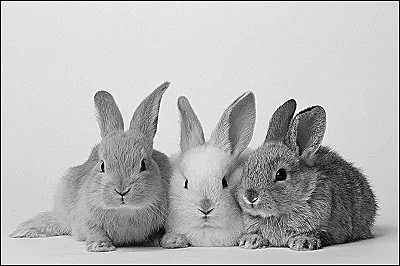

In [ ]:
kernel_sharpen = np.array([[0,-1,0],
                           [-1,5,-1],
                           [0,-1,0]])

cv2_imshow(convolution2d(img_gray, kernel_sharpen, 1, 2))


## **Implementasi Emboss**

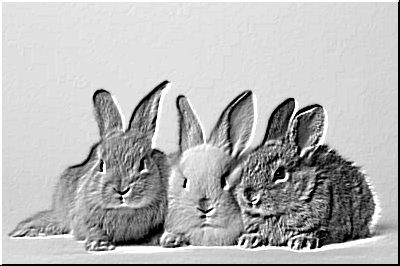

In [ ]:
kernel_emboss = np.array([[-2,-1,0],
                          [-1,1,1],
                          [0,1,2]])

cv2_imshow(convolution2d(img_gray, kernel_emboss, 1, 2))

## **Implementasi Left Sobel Edge Detection**

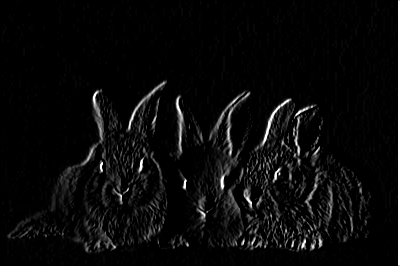

In [ ]:
kernel_sobel = np.array([[1,0,-1],
                         [2,0,-2],
                         [1,0,-1]])

cv2_imshow(convolution2d(img_gray, kernel_sobel, 1, 2))

## **Implementasi Canny Edge Detection**

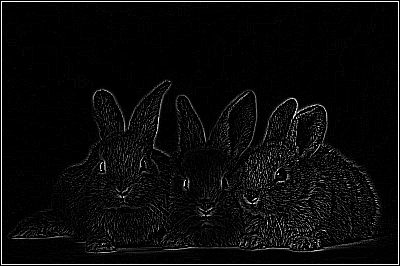

In [ ]:
kernel_canny = np.array([[-1,-1,-1],
                         [-1,8,-1],
                         [-1,-1,-1]])

cv2_imshow(convolution2d(img_gray, kernel_canny, 1, 2))

## **Implementasi Prewitt Edge Detection**

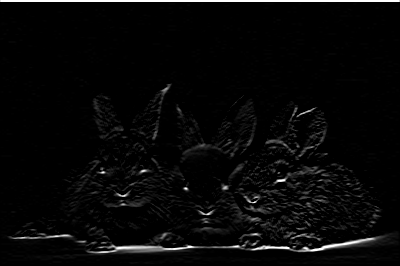

In [ ]:
kernel_prewitt = np.array([[-1,-1,-1],
                         [0,0,0],
                         [1,1,1]])

cv2_imshow(convolution2d(img_gray, kernel_prewitt, 1, 2))

## **21x21 Gaussian Blur**

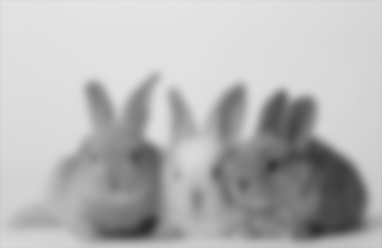

In [ ]:
kernel_size = 21
sigma = math.sqrt(kernel_size)
gaussian_kernel = cv.getGaussianKernel(kernel_size, sigma)
gauss_kernel = gaussian_kernel @ gaussian_kernel.transpose()

cv2_imshow(convolution2d(img_gray, gauss_kernel, 1, 2))